# Flight Price Prediction

# Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travellers saying that flight ticket prices are so unpredictable. The prices of flight tickets for various airlines between the months of March and June of 2019 and between various cities is taken.

FEATURES:
Airline: The name of the airline.

Date_of_Journey: The date of the journey

Source: The source from which the service begins.

Destination: The destination where the service ends.

Route: The route taken by the flight to reach the destination.

Dep_Time: The time when the journey starts from the source.

Arrival_Time: Time of arrival at the destination.

Duration: Total duration of the flight.

Total_Stops: Total stops between the source and destination.

Additional_Info: Additional information about the flight

Price: The price of the ticket.

# The target variable is price. It is a regression problem.

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
import warnings
warnings.filterwarnings('ignore')

In [4]:
train_data=pd.read_csv('flight_train_data.csv')

In [6]:
train_data

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


In [7]:
test_data=pd.read_csv('flight_test_data.csv')

In [8]:
test_data

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
...,...,...,...,...,...,...,...,...,...,...
2666,Air India,6/06/2019,Kolkata,Banglore,CCU → DEL → BLR,20:30,20:25 07 Jun,23h 55m,1 stop,No info
2667,IndiGo,27/03/2019,Kolkata,Banglore,CCU → BLR,14:20,16:55,2h 35m,non-stop,No info
2668,Jet Airways,6/03/2019,Delhi,Cochin,DEL → BOM → COK,21:50,04:25 07 Mar,6h 35m,1 stop,No info
2669,Air India,6/03/2019,Delhi,Cochin,DEL → BOM → COK,04:00,19:15,15h 15m,1 stop,No info


In [9]:
df=pd.DataFrame(train_data)

In [10]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


In [11]:
df1=pd.DataFrame(test_data)

In [12]:
df1

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
...,...,...,...,...,...,...,...,...,...,...
2666,Air India,6/06/2019,Kolkata,Banglore,CCU → DEL → BLR,20:30,20:25 07 Jun,23h 55m,1 stop,No info
2667,IndiGo,27/03/2019,Kolkata,Banglore,CCU → BLR,14:20,16:55,2h 35m,non-stop,No info
2668,Jet Airways,6/03/2019,Delhi,Cochin,DEL → BOM → COK,21:50,04:25 07 Mar,6h 35m,1 stop,No info
2669,Air India,6/03/2019,Delhi,Cochin,DEL → BOM → COK,04:00,19:15,15h 15m,1 stop,No info


There are 10683 records and 11 features in training dataset. 

There are 2671 records and 10 features in test dataset.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


All the features except price are of object datatype.

In [15]:
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

<AxesSubplot:>

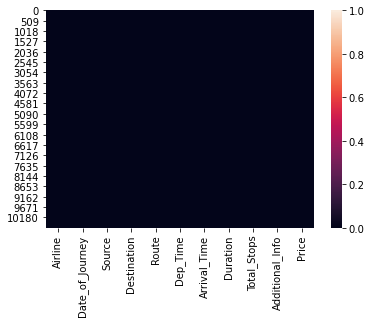

In [16]:
sns.heatmap(df.isnull())

There are null values present in features named as 'Total_stop' and 'Route'. I will be dropping the null values from the train dataset as dropping such will not affect dataset as there is only 1 null value present each in features 'Total_Stops' and 'Route'.        

In [17]:
df.dropna(inplace=True)

In [18]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


In [19]:
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
Price              0
dtype: int64

There are no null values present in the dataset.

In [28]:
df3=df.copy()

In [30]:
df3['Journey_date']=df3['Date_of_Journey'].str.split('/').str[0]
df3['Journey_month']=df3['Date_of_Journey'].str.split('/').str[1]
df3.drop(['Date_of_Journey'],axis=1,inplace=True)

I have extracted Journey date and Journey month from Date of Journey. I have dropped Date of Journey feature after extracting data.

In [32]:
df3['Airline'].value_counts()

Jet Airways                          3849
IndiGo                               2053
Air India                            1751
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: Airline, dtype: int64

Text(0, 0.5, 'Count of flights')

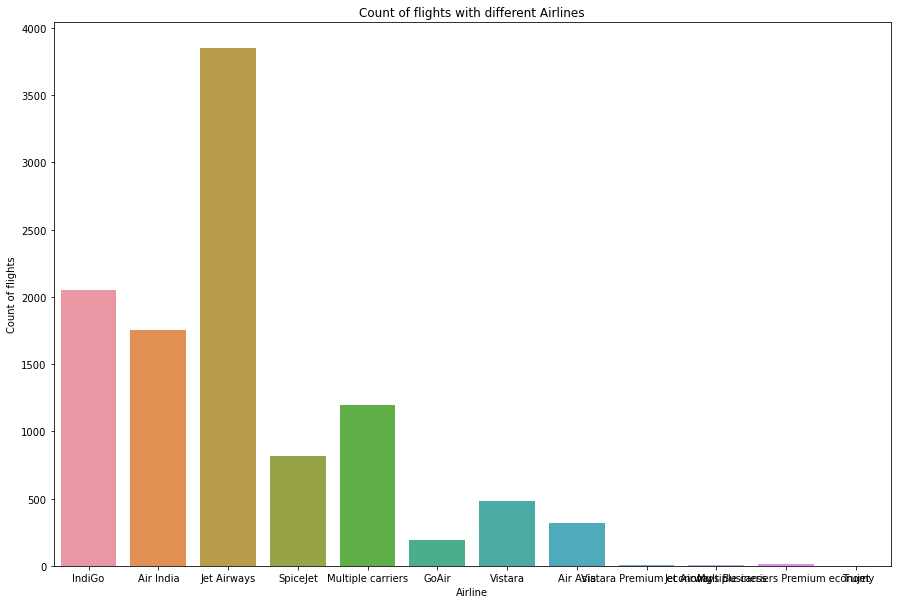

In [37]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights with different Airlines')
ax=sns.countplot(x = 'Airline', data =train_data)
plt.xlabel('Airline')
plt.ylabel('Count of flights')

There are more number of flights of Jet Airways.
Jet Airways Business, Vistara Premium economy, Trujet have actually almost negligible flights.


Text(0, 0.5, 'Price of ticket')

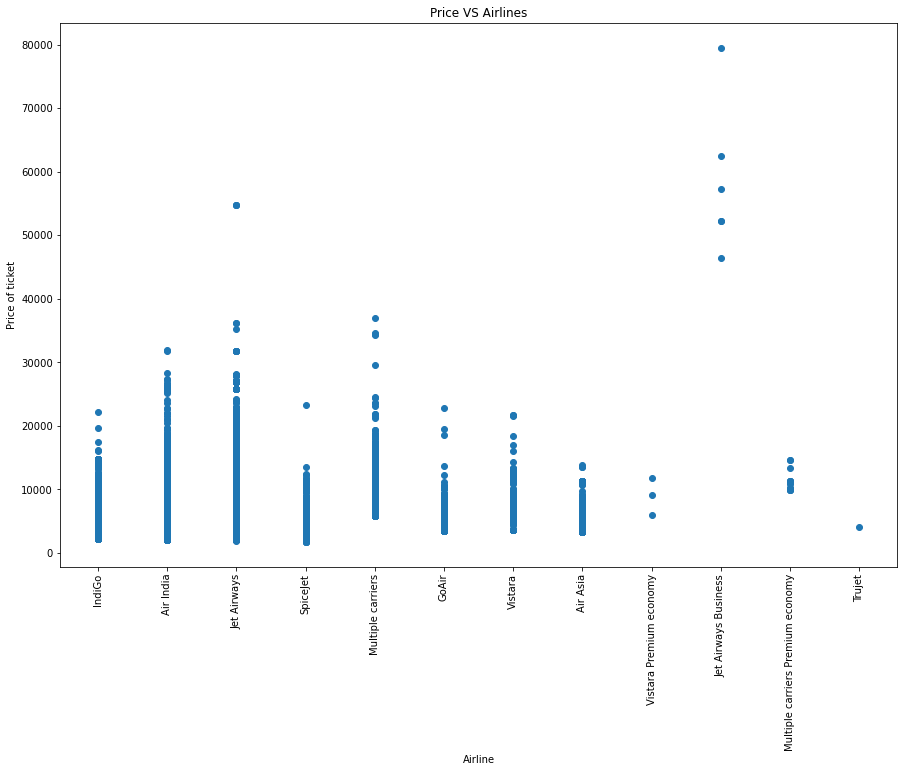

In [45]:
plt.figure(figsize = (15, 10))
plt.title('Price VS Airlines')
plt.scatter(df3['Airline'], df3['Price'])
plt.xticks(rotation = 90)
plt.xlabel('Airline')
plt.ylabel('Price of ticket')


The ticket rate for Jet Airways Business airline is high.

Text(0, 0.5, 'Count of flights')

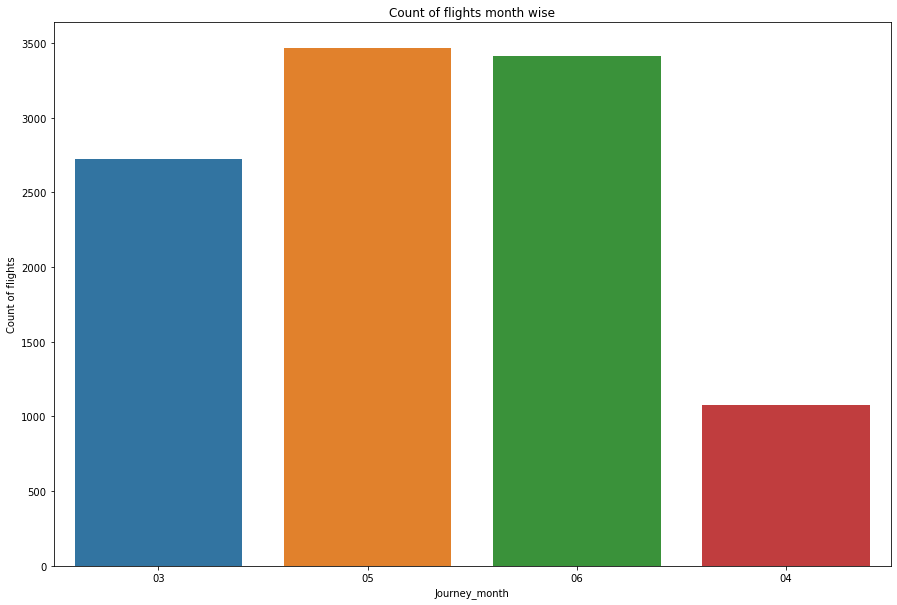

In [46]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights month wise')
ax=sns.countplot(x = 'Journey_month', data=df3)
plt.xlabel('Journey_month')
plt.ylabel('Count of flights')

In [47]:
df3['Journey_month'].value_counts()

05    3465
06    3414
03    2724
04    1079
Name: Journey_month, dtype: int64

May is the month where 3465 flights i.e highest among all the months are operated which indicates the peak season for travelling.
April is the month where only 1079 flights are operated lowest among all the months which indicates slack season for travelling.

In [49]:
df3['Source'].value_counts()

Delhi       4536
Kolkata     2871
Banglore    2197
Mumbai       697
Chennai      381
Name: Source, dtype: int64

Delhi is the source location from where maximum no of flights are operated.
Chennai is the source location from where minimum no of flights are operated.

Text(0, 0.5, 'Count of flights')

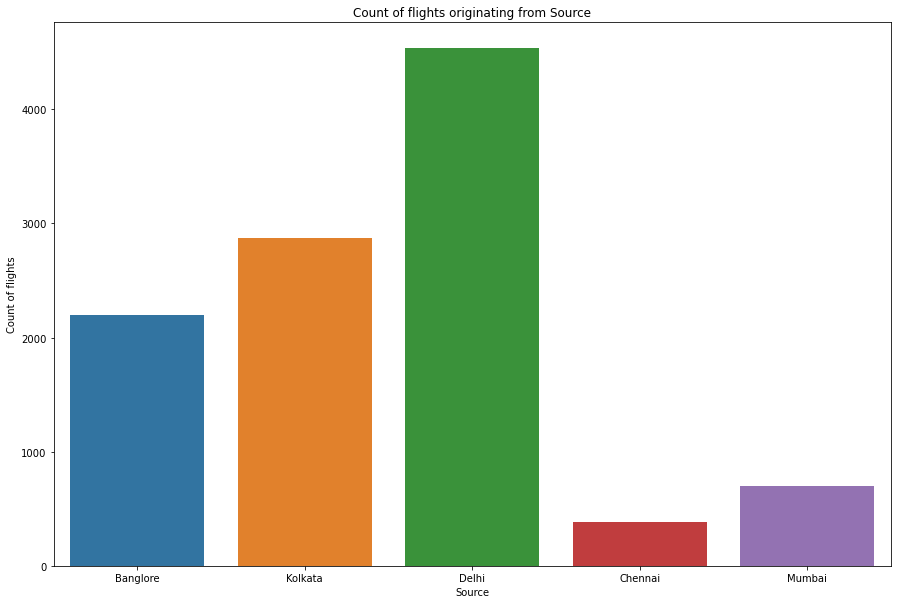

In [52]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights originating from Source')
ax=sns.countplot(x = 'Source', data=df3)
plt.xlabel('Source')
plt.ylabel('Count of flights')

In [53]:
df3['Destination'].value_counts()

Cochin       4536
Banglore     2871
Delhi        1265
New Delhi     932
Hyderabad     697
Kolkata       381
Name: Destination, dtype: int64

The maximum flights are operated for Cochin as a destination.
The minimum flights are operated for Kolkata as a destination.

Text(0, 0.5, 'Count of flights')

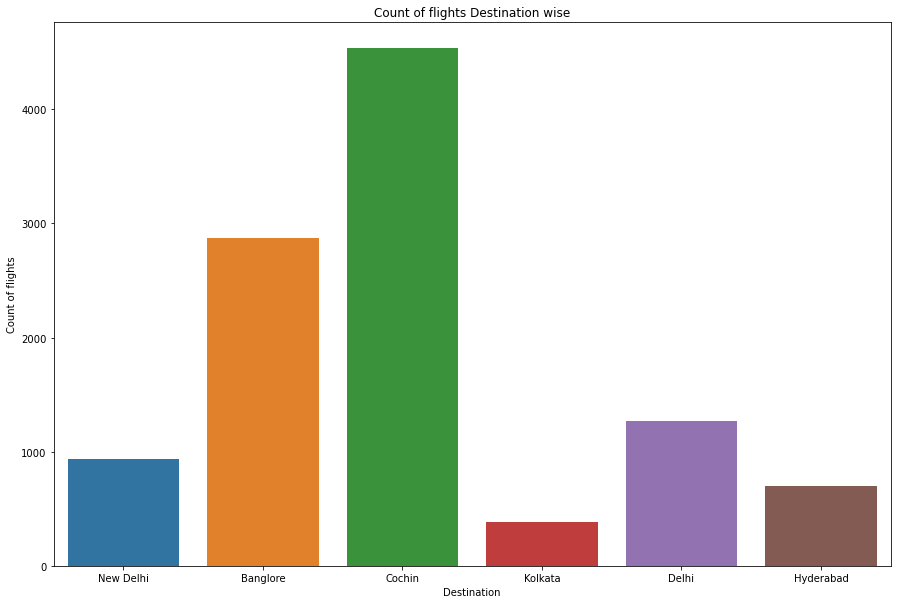

In [54]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights Destination wise')
ax=sns.countplot(x = 'Destination', data=df3)
plt.xlabel('Destination')
plt.ylabel('Count of flights')

Text(0, 0.5, 'Price of ticket')

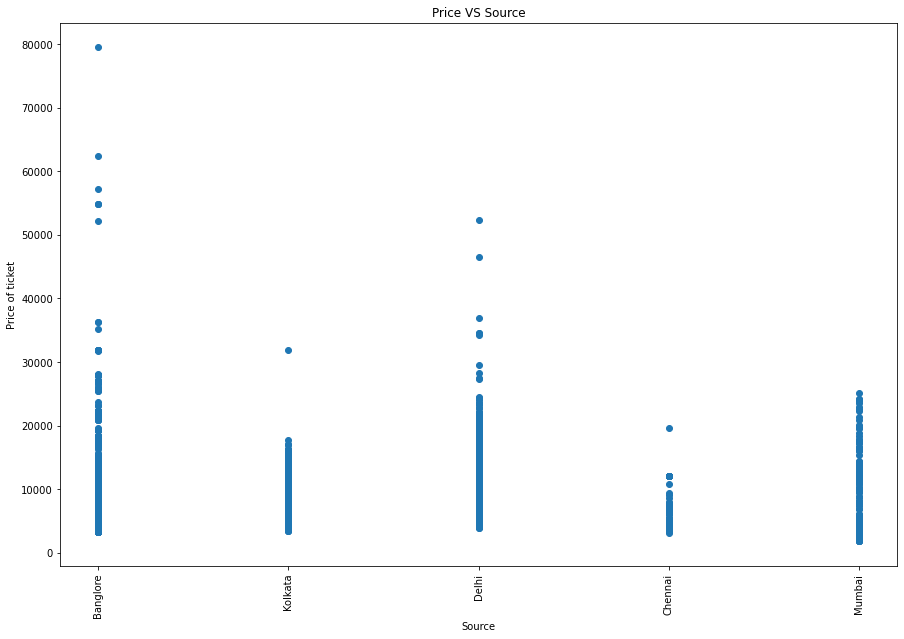

In [55]:
plt.figure(figsize = (15, 10))
plt.title('Price VS Source')
plt.scatter(df3['Source'], df3['Price'])
plt.xticks(rotation = 90)
plt.xlabel('Source')
plt.ylabel('Price of ticket')

The Banglore is having the highest price of ticket among all other cities i.e for the flights originating from Banglore.

Text(0, 0.5, 'Price of ticket')

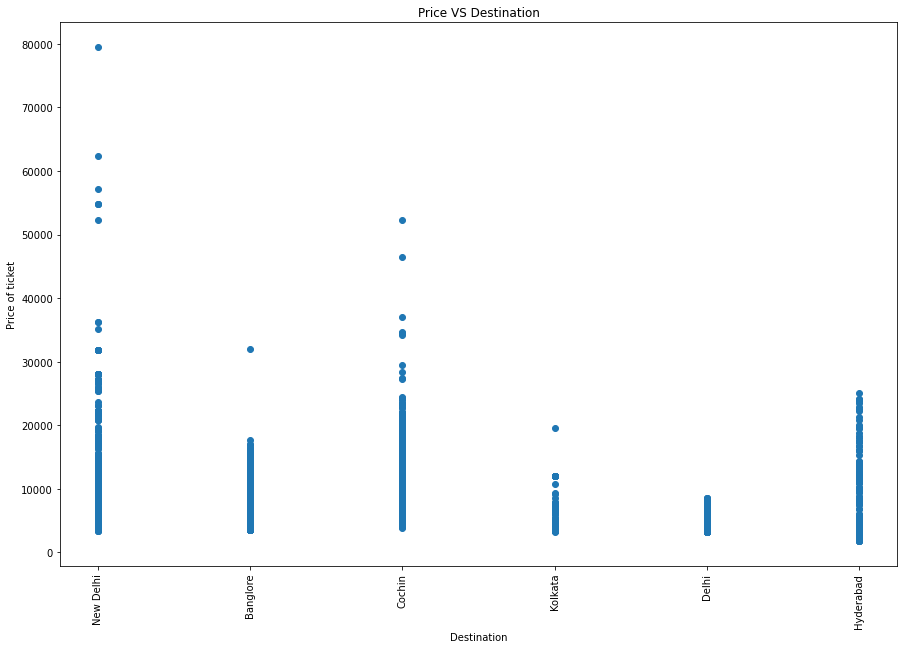

In [56]:
plt.figure(figsize = (15, 10))
plt.title('Price VS Destination')
plt.scatter(df3['Destination'], df3['Price'])
plt.xticks(rotation = 90)
plt.xlabel('Destination')
plt.ylabel('Price of ticket')

The Delhi is having the highest price of ticket among all other cities i.e for the flights destined for Delhi.

In [59]:
df3['Dep_hour']=pd.to_datetime(df3['Dep_Time']).dt.hour
df3['Dep_min']=pd.to_datetime(df3['Dep_Time']).dt.minute

In [61]:
df3.drop(['Dep_Time'],axis=1,inplace=True)

I have extracted Dep_hour and Dep_min from Dep_Time. I have dropped Dep_Time feature after extracting data.

Text(0, 0.5, 'Price of ticket')

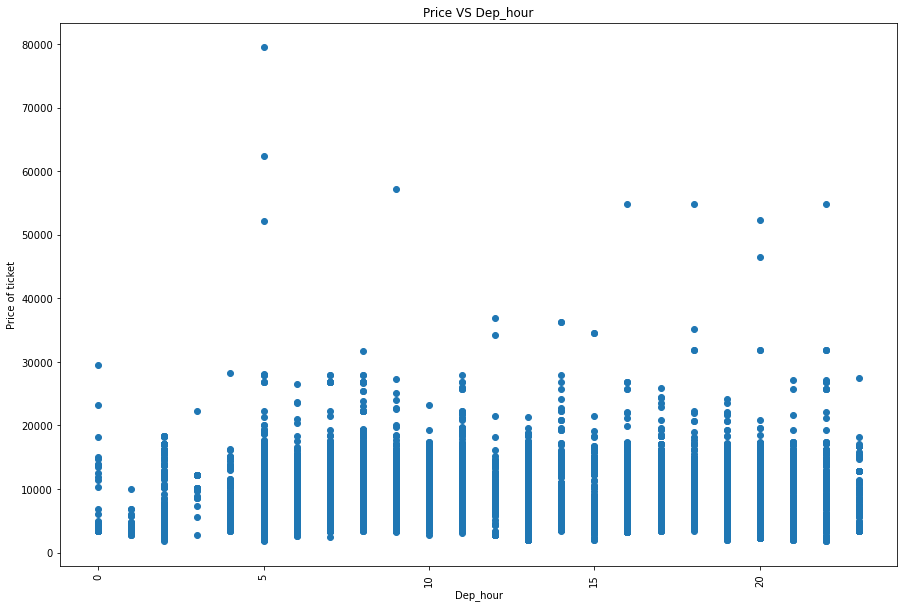

In [103]:
plt.figure(figsize = (15, 10))
plt.title('Price VS Dep_hour')
plt.scatter(df3['Dep_hour'], df3['Price'])
plt.xticks(rotation = 90)
plt.xlabel('Dep_hour')
plt.ylabel('Price of ticket')

The flight having depature time of 5 in the morning is having highest ticket price as compared to others.

In [64]:
df3['Arrival_hour']=pd.to_datetime(df3['Arrival_Time']).dt.hour
df3['Arrival_min']=pd.to_datetime(df3['Arrival_Time']).dt.minute

In [66]:
df3.drop(['Arrival_Time'],axis=1,inplace=True)

Text(0, 0.5, 'Price of ticket')

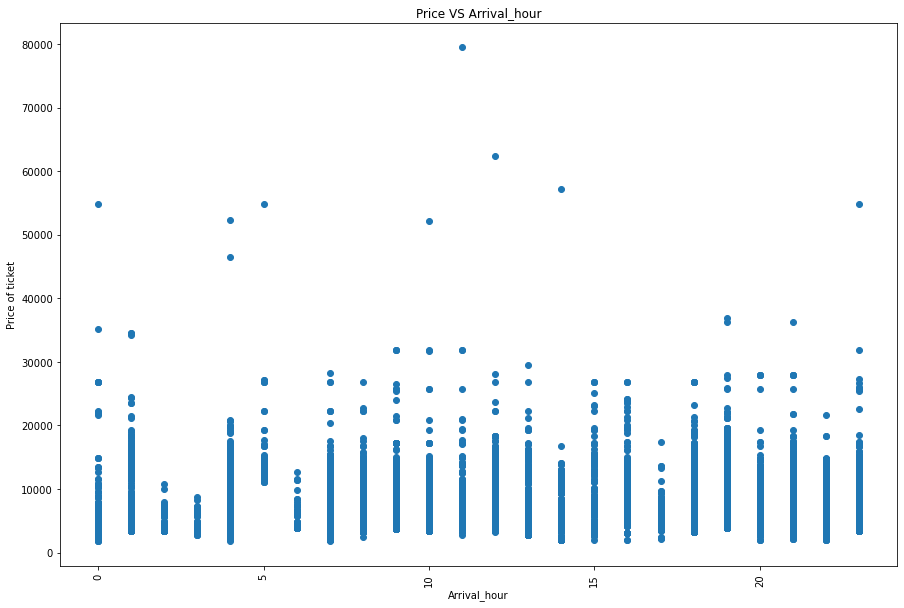

In [106]:
plt.figure(figsize = (15, 10))
plt.title('Price VS Arrival_hour')
plt.scatter(df3['Arrival_hour'], df3['Price'])
plt.xticks(rotation = 90)
plt.xlabel('Arrival_hour')
plt.ylabel('Price of ticket')

The price of the ticket is cheapest for the flight arrival time at midnight from 3 am to 5 am.

In [69]:
df3['Duration']= df3['Duration'].str.replace("h", '*60').str.replace(' ','+').str.replace('m','*1').apply(eval)

# I have converted duration hours into minutes.

In [72]:
pd.set_option('display.max_rows',None)
df3['Duration'].value_counts()

170     550
90      386
165     337
175     337
155     329
180     261
140     238
150     220
160     158
85      135
135     135
145      98
810      97
800      89
195      88
450      86
570      85
520      81
435      79
185      78
330      72
455      71
480      68
425      65
590      64
540      64
300      63
705      62
315      62
660      62
80       61
865      61
395      60
730      57
630      57
1375     57
765      56
345      54
965      53
750      52
440      52
690      52
910      51
295      51
615      50
505      50
625      49
600      49
720      49
735      48
375      47
320      45
665      45
1615     44
555      42
845      42
780      42
535      42
575      41
1210     41
560      41
190      40
1025     40
1275     39
1420     39
1595     39
875      38
390      38
305      38
1655     38
1430     37
385      37
805      36
1125     36
840      36
510      36
795      36
675      36
745      36
1295     35
925      35
830      35
920      35
290 

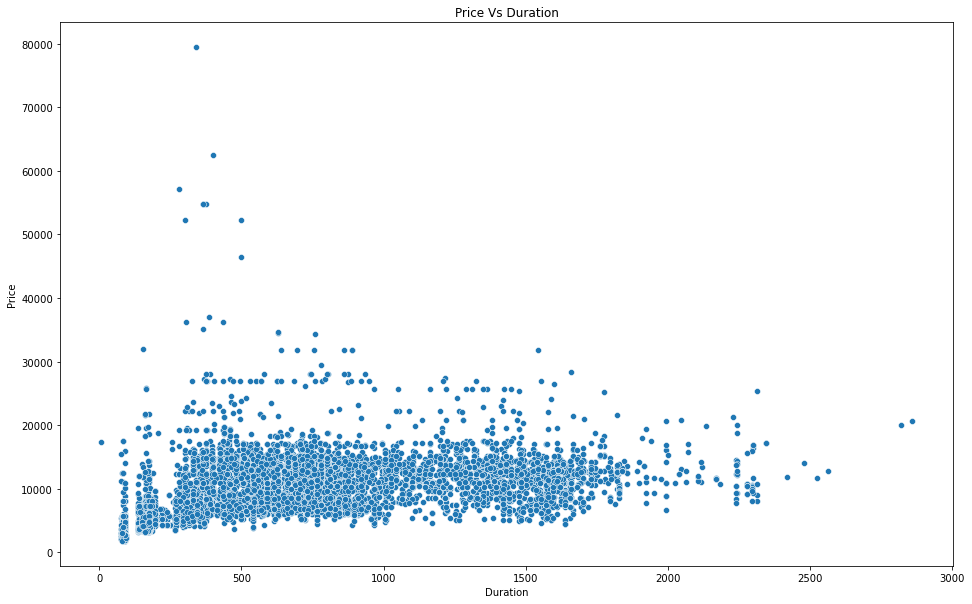

In [75]:
plt.figure(figsize=[16,10])
plt.title("Price Vs Duration")
sns.scatterplot(x='Duration',y='Price',data=df3)
plt.show()

In [76]:
df3[df3['Price']<20000]['Price'].value_counts()

10262    258
10844    212
7229     162
4804     160
4823     131
14714    109
3943     104
15129     93
3841      91
12898     86
3597      86
9663      84
14781     84
3873      80
12373     77
14151     74
8586      70
4174      69
5678      65
10368     63
6442      60
8016      60
3100      58
14571     57
13941     57
13014     57
11087     57
2754      56
4423      53
4544      51
4668      49
14388     49
13377     49
7832      47
3543      45
8372      43
3419      43
13587     42
13067     42
7480      40
2227      40
7064      40
8040      39
13376     39
9646      38
4049      38
6961      37
13292     36
15554     36
16079     36
1965      36
13817     35
4995      35
2017      35
4878      34
13029     33
4148      32
5228      32
14871     31
3383      31
6093      30
12692     30
4030      29
4409      29
4591      29
5403      29
3625      29
11467     29
8452      28
5192      28
6144      27
8610      27
6795      27
8529      26
7408      26
13727     26
16736     25

Most of the records i.e say flight Price ticket is in the range of 3000 to 20000 Rupees.

Most of the records i.e say Duration(From Source to Destination) is in the range of 60 minutes to 2000 minutes.

In [77]:
df3['Total_Stops'].value_counts()

1 stop      5625
non-stop    3491
2 stops     1520
3 stops       45
4 stops        1
Name: Total_Stops, dtype: int64

Most of the flights are having 1 stop during the journey between source and destination.

<AxesSubplot:xlabel='Total_Stops', ylabel='count'>

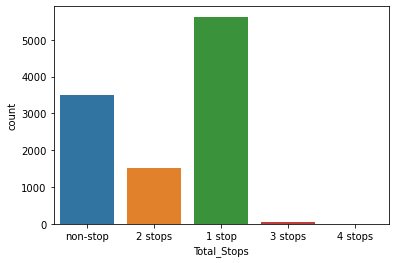

In [79]:
sns.countplot(df3['Total_Stops'])

In [80]:
df3['Total_Stops'].unique()

array(['non-stop', '2 stops', '1 stop', '3 stops', '4 stops'],
      dtype=object)

In [81]:
df3['Total_Stops']=df3['Total_Stops'].replace(['non-stop','2 stops','1 stop','3 stops','4 stops'],[0,2,1,3,4])

In [82]:
df3['Total_Stops'].value_counts()

1    5625
0    3491
2    1520
3      45
4       1
Name: Total_Stops, dtype: int64

<AxesSubplot:title={'center':'Price VS Total_Stops'}, xlabel='Total_Stops', ylabel='Price'>

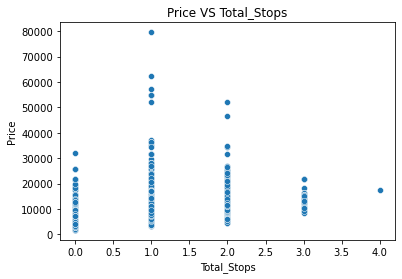

In [87]:
plt.title('Price VS Total_Stops')
sns.scatterplot(x='Total_Stops',y='Price',data=df3)

There is only one flight with 4 stops.

The flight with one stop is having highest ticket price as compared to others.

In [88]:
df3["Additional_Info"].value_counts()

No info                         8344
In-flight meal not included     1982
No check-in baggage included     320
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
1 Short layover                    1
2 Long layover                     1
Red-eye flight                     1
Name: Additional_Info, dtype: int64

In [89]:
df3['Additional_Info'].unique()

array(['No info', 'In-flight meal not included',
       'No check-in baggage included', '1 Short layover', 'No Info',
       '1 Long layover', 'Change airports', 'Business class',
       'Red-eye flight', '2 Long layover'], dtype=object)

In [90]:
df3['Additional_Info']=df3['Additional_Info'].replace('No Info','No info')

In [91]:
df3["Additional_Info"].value_counts()

No info                         8347
In-flight meal not included     1982
No check-in baggage included     320
1 Long layover                    19
Change airports                    7
Business class                     4
1 Short layover                    1
2 Long layover                     1
Red-eye flight                     1
Name: Additional_Info, dtype: int64

There are 8347 records with No info against Additional_info feature.

Text(0, 0.5, 'Price of ticket')

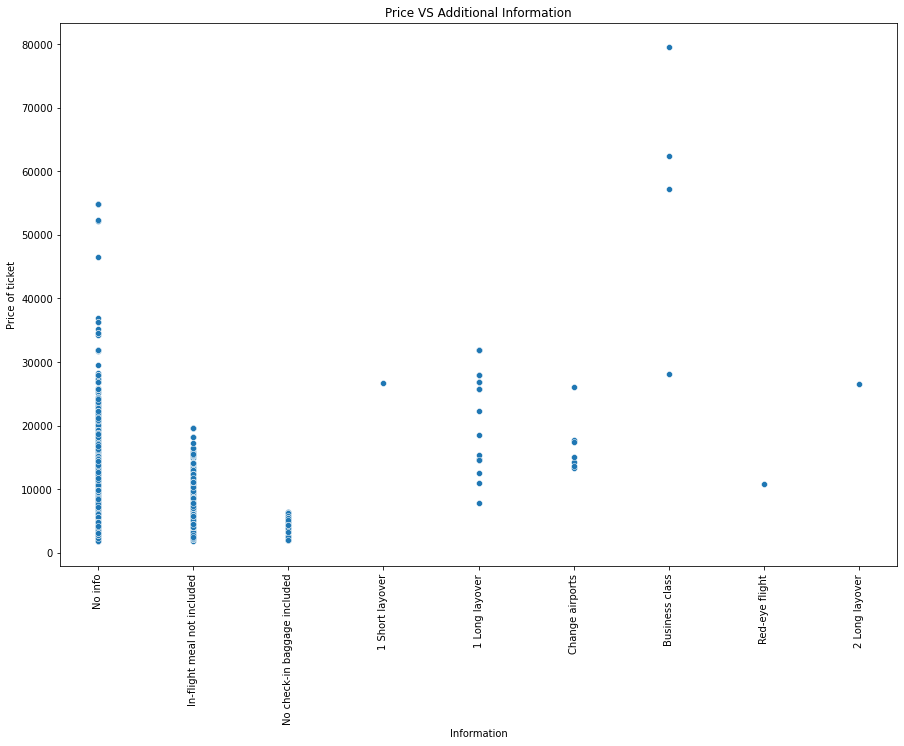

In [92]:
plt.figure(figsize = (15, 10))
plt.title('Price VS Additional Information')
sns.scatterplot(df3['Additional_Info'], df3['Price'],data=df3)
plt.xticks(rotation = 90)
plt.xlabel('Information')
plt.ylabel('Price of ticket')

From above scatter plot it is clear that the ticket prices for Business class is higher.


In [93]:
df3["Additional_Info"].unique()

array(['No info', 'In-flight meal not included',
       'No check-in baggage included', '1 Short layover',
       '1 Long layover', 'Change airports', 'Business class',
       'Red-eye flight', '2 Long layover'], dtype=object)

In [94]:
df3['Additional_Info']=df3['Additional_Info'].replace({'Change airports':'Other','Business class':'Other','1 Short layover':'Other','Red-eye flight':'Other','2 Long layover':'Other'})

In [97]:
df3['Additional_Info'].value_counts()

No info                         8347
In-flight meal not included     1982
No check-in baggage included     320
1 Long layover                    19
Other                             14
Name: Additional_Info, dtype: int64

<AxesSubplot:xlabel='Price'>

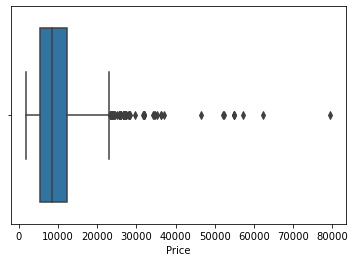

In [98]:
sns.boxplot(df3['Price'])

There are outliers present in the target variable i.e Price  but as it a target variable it cannot be removed.

In [100]:
df3['Price'].value_counts()

10262    258
10844    212
7229     162
4804     160
4823     131
14714    109
3943     104
15129     93
3841      91
12898     86
3597      86
14781     84
9663      84
3873      80
12373     77
14151     74
8586      70
4174      69
5678      65
10368     63
6442      60
8016      60
3100      58
11087     57
14571     57
13014     57
13941     57
2754      56
4423      53
4544      51
14388     49
13377     49
4668      49
7832      47
3543      45
3419      43
8372      43
13067     42
13587     42
7480      40
7064      40
2227      40
13376     39
8040      39
9646      38
4049      38
6961      37
15554     36
13292     36
1965      36
16079     36
2017      35
4995      35
13817     35
4878      34
13029     33
5228      32
4148      32
14871     31
3383      31
12692     30
6093      30
4591      29
5403      29
4409      29
3625      29
4030      29
11467     29
5192      28
8452      28
6795      27
6144      27
8610      27
13727     26
7408      26
8529      26
9314      25

(array([6.028e+03, 4.390e+03, 1.820e+02, 6.600e+01, 7.000e+00, 1.000e+00,
        5.000e+00, 2.000e+00, 0.000e+00, 1.000e+00]),
 array([ 1759. ,  9534.3, 17309.6, 25084.9, 32860.2, 40635.5, 48410.8,
        56186.1, 63961.4, 71736.7, 79512. ]),
 <BarContainer object of 10 artists>)

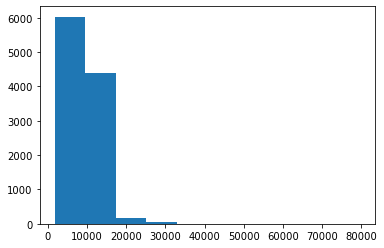

In [102]:
plt.hist(df3['Price'])

The most of the records for the flight ticket is lying in the range of 3000 to 10000.

As most the features are having object datatype there is no need to check for outliers and skewness.

# Applying LabelEncoding to the feature having object datatype

In [107]:
df3

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,Journey_date,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min
0,IndiGo,Banglore,New Delhi,BLR → DEL,170,0,No info,3897,24,03,22,20,1,10
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,445,2,No info,7662,1,05,5,50,13,15
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,1140,2,No info,13882,9,06,9,25,4,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,325,1,No info,6218,12,05,18,5,23,30
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,285,1,No info,13302,01,03,16,50,21,35
5,SpiceJet,Kolkata,Banglore,CCU → BLR,145,0,No info,3873,24,06,9,0,11,25
6,Jet Airways,Banglore,New Delhi,BLR → BOM → DEL,930,1,In-flight meal not included,11087,12,03,18,55,10,25
7,Jet Airways,Banglore,New Delhi,BLR → BOM → DEL,1265,1,No info,22270,01,03,8,0,5,5
8,Jet Airways,Banglore,New Delhi,BLR → BOM → DEL,1530,1,In-flight meal not included,11087,12,03,8,55,10,25
9,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,470,1,No info,8625,27,05,11,25,19,15


In [108]:
from sklearn.preprocessing import LabelEncoder

In [109]:
df4=df3.copy()
le=LabelEncoder()
df4['Airline']=le.fit_transform(df4['Airline'])
df4['Source']=le.fit_transform(df4['Source'])
df4['Destination']=le.fit_transform(df4['Destination'])
df4['Route']=le.fit_transform(df4['Route'])
df4['Additional_Info']=le.fit_transform(df4['Additional_Info'])

In [113]:
df4['Journey_date']=df4['Journey_date'].astype('int')

In [116]:
df4['Journey_month']=df4['Journey_month'].astype('int')

In [117]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10682 entries, 0 to 10682
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Airline          10682 non-null  int32
 1   Source           10682 non-null  int32
 2   Destination      10682 non-null  int32
 3   Route            10682 non-null  int32
 4   Duration         10682 non-null  int64
 5   Total_Stops      10682 non-null  int64
 6   Additional_Info  10682 non-null  int32
 7   Price            10682 non-null  int64
 8   Journey_date     10682 non-null  int32
 9   Journey_month    10682 non-null  int32
 10  Dep_hour         10682 non-null  int64
 11  Dep_min          10682 non-null  int64
 12  Arrival_hour     10682 non-null  int64
 13  Arrival_min      10682 non-null  int64
dtypes: int32(7), int64(7)
memory usage: 1.2 MB


# All the features are converted into integer datatype.

In [118]:
x=df4.drop('Price',axis=1)
y=df4['Price']

In [120]:
from sklearn.preprocessing import StandardScaler

In [121]:
se=StandardScaler()
x=se.fit_transform(x)

In [140]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=40)

In [141]:
le=LinearRegression()
le.fit(x_train,y_train)
pred=le.predict(x_test)
print(mean_absolute_error(y_test,pred))
print(mean_squared_error(y_test,pred))
print(np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))

2512.9628856896047
13263269.550639726
3641.8772014772444
0.4217693740150549


In [142]:
dtc=DecisionTreeRegressor()
dtc.fit(x_train,y_train)
pred1=dtc.predict(x_test)
print(mean_absolute_error(y_test,pred1))
print(mean_squared_error(y_test,pred1))
print(np.sqrt(mean_squared_error(y_test,pred1)))
print(r2_score(y_test,pred1))

753.3167966718668
4534684.878869821
2129.479955028885
0.8023041252277882


In [143]:
knr=KNeighborsRegressor()
knr.fit(x_train,y_train)
pred2=knr.predict(x_test)
print(mean_absolute_error(y_test,pred2))
print(mean_squared_error(y_test,pred2))
print(np.sqrt(mean_squared_error(y_test,pred2)))
print(r2_score(y_test,pred2))

1202.4417472698908
5546176.811968799
2355.032231619941
0.7582067319401479


In [144]:
svr=SVR()
svr.fit(x_train,y_train)
pred3=svr.predict(x_test)
print(mean_absolute_error(y_test,pred3))
print(mean_squared_error(y_test,pred3))
print(np.sqrt(mean_squared_error(y_test,pred3)))
print(r2_score(y_test,pred3))


3499.0535898580524
22367127.41986474
4729.389751317261
0.024874067431615687


In [146]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred4=rfr.predict(x_test)
print(mean_absolute_error(y_test,pred4))
print(mean_squared_error(y_test,pred4))
print(np.sqrt(mean_squared_error(y_test,pred4)))
print(r2_score(y_test,pred4))


675.1823409937351
2935573.080613764
1713.351417723102
0.8720196212896858


In [147]:
ada=AdaBoostRegressor()
ada.fit(x_train,y_train)
pred5=ada.predict(x_test)
print(mean_absolute_error(y_test,pred5))
print(mean_squared_error(y_test,pred5))
print(np.sqrt(mean_squared_error(y_test,pred5)))
print(r2_score(y_test,pred5))


3147.659860683501
15515050.814633317
3938.9149285854496
0.32359984764835426


In [148]:
gr=GradientBoostingRegressor()
gr.fit(x_train,y_train)
pred6=ada.predict(x_test)
print(mean_absolute_error(y_test,pred6))
print(mean_squared_error(y_test,pred6))
print(np.sqrt(mean_squared_error(y_test,pred6)))
print(r2_score(y_test,pred6))

3147.659860683501
15515050.814633317
3938.9149285854496
0.32359984764835426


In [149]:
from sklearn.linear_model import Lasso,Ridge

In [150]:
ls=Lasso()
ls.fit(x_train,y_train)
pred7=ls.predict(x_test)
print(mean_absolute_error(y_test,pred7))
print(mean_squared_error(y_test,pred7))
print(np.sqrt(mean_squared_error(y_test,pred7)))
print(r2_score(y_test,pred7))

2512.637386712188
13263886.332172116
3641.9618795605365
0.421742484568964


In [151]:
rd=Ridge()
rd.fit(x_train,y_train)
pred8=rd.predict(x_test)
print(mean_absolute_error(y_test,pred8))
print(mean_squared_error(y_test,pred8))
print(np.sqrt(mean_squared_error(y_test,pred8)))
print(r2_score(y_test,pred8))

2512.9443602613155
13263449.406267196
3641.901894102475
0.42176153295960006


# Checking out cross_val_score

In [152]:
from sklearn.model_selection import cross_val_score

In [154]:
score=cross_val_score(le,x,y,cv=5)
print(score.mean())

0.4383790804959472


In [156]:
score1=cross_val_score(dtc,x,y,cv=5)
print(score1.mean())

0.767984917156501


In [157]:
score2=cross_val_score(knr,x,y,cv=5)
print(score2.mean())

0.7883156093526053


In [158]:
score3=cross_val_score(svr,x,y,cv=5)
print(score3.mean())

0.0335524496729114


In [159]:
score4=cross_val_score(rfr,x,y,cv=5)
print(score4.mean())

0.8840413590850069


In [160]:
score5=cross_val_score(ada,x,y,cv=5)
print(score5.mean())

0.30530879196142713


In [161]:
score6=cross_val_score(gr,x,y,cv=5)
print(score6.mean())

0.8217164251039296


In [162]:
score7=cross_val_score(ls,x,y,cv=5)
print(score7.mean())

0.43837929595218394


In [163]:
score8=cross_val_score(rd,x,y,cv=5)
print(score8.mean())

0.4383794483510937


 Based on the difference of cross_val_score and r2_score linear Regression, RandomForestRegressor,Lasso,Ridge are the best model.

# To find the best model out of all the mentioned above will do hypertuning  of parameters.

In [165]:
from sklearn.model_selection import RandomizedSearchCV

In [167]:
params={'fit_intercept':['True','False']}

In [169]:
re=RandomizedSearchCV(le,param_distributions=params,n_jobs=-1,cv=5)
re.fit(x_train,y_train)
re.best_params_

{'fit_intercept': 'True'}

In [170]:
le=LinearRegression(fit_intercept='True')
le.fit(x_train,y_train)
pred9=le.predict(x_test)
print(mean_absolute_error(y_test,pred9))
print(mean_squared_error(y_test,pred9))
print(np.sqrt(mean_squared_error(y_test,pred9)))
print(r2_score(y_test,pred9))


2512.9628856896047
13263269.550639726
3641.8772014772444
0.4217693740150549


In [172]:
params1={'n_estimators':[30,50,70,100],'criterion':['mse','mae'],'max_depth':np.arange(1,10),'max_features':['auto','sqrt','log2']}

In [173]:
re1=RandomizedSearchCV(rfr,param_distributions=params1,n_jobs=-1,cv=5)
re1.fit(x_train,y_train)
re1.best_params_

{'n_estimators': 30,
 'max_features': 'auto',
 'max_depth': 9,
 'criterion': 'mse'}

In [175]:
rfr=RandomForestRegressor(n_estimators=30,criterion='mse',max_depth=9,max_features='auto')
rfr.fit(x_train,y_train)
pred10=rfr.predict(x_test)
print(mean_absolute_error(y_test,pred10))
print(mean_squared_error(y_test,pred10))
print(np.sqrt(mean_squared_error(y_test,pred10)))
print(r2_score(y_test,pred10))


1039.1537436748122
3940494.9444207624
1985.0679949111975
0.8282086592824294


In [177]:
params2={'fit_intercept':['True','False'],'random_state':np.arange(1,100)}

In [178]:
re2=RandomizedSearchCV(ls,param_distributions=params2,n_jobs=-1,cv=5)
re2.fit(x_train,y_train)
re2.best_params_

{'random_state': 32, 'fit_intercept': 'True'}

In [179]:
ls=Lasso(fit_intercept='True',random_state=32)
ls.fit(x_train,y_train)
pred11=ls.predict(x_test)
print(mean_absolute_error(y_test,pred11))
print(mean_squared_error(y_test,pred11))
print(np.sqrt(mean_squared_error(y_test,pred11)))
print(r2_score(y_test,pred11))

2512.637386712188
13263886.332172116
3641.9618795605365
0.421742484568964


In [180]:
Ridge?

In [181]:
params3={'fit_intercept':['True','False'],'random_state':np.arange(1,100)}

In [182]:
re3=RandomizedSearchCV(rd,param_distributions=params3,n_jobs=-1,cv=5)
re3.fit(x_train,y_train)
re3.best_params_

{'random_state': 70, 'fit_intercept': 'True'}

In [183]:
rd=Ridge(fit_intercept='True',random_state=70)
rd.fit(x_train,y_train)
pred12=rd.predict(x_test)
print(mean_absolute_error(y_test,pred12))
print(mean_squared_error(y_test,pred12))
print(np.sqrt(mean_squared_error(y_test,pred12)))
print(r2_score(y_test,pred12))

2512.9443602613155
13263449.406267196
3641.901894102475
0.42176153295960006


# RandomForestRegressor is my best model

Text(0.5, 1.0, 'Random Forest Regressor')

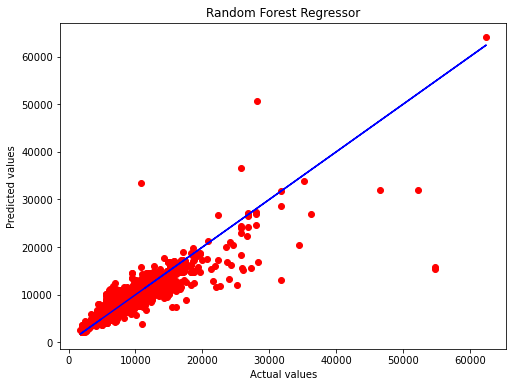

In [185]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred10,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Random Forest Regressor")

In [186]:
import joblib

In [187]:
joblib.dump(rfr,'price_flight_prediction.obj')

['price_flight_prediction.obj']

In [188]:
joblib.load('price_flight_prediction.obj')

RandomForestRegressor(max_depth=9, n_estimators=30)

# Working with the Test Data.

In [189]:
df1=pd.DataFrame(test_data)

In [190]:
df1

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
5,Jet Airways,12/06/2019,Delhi,Cochin,DEL → BOM → COK,18:15,12:35 13 Jun,18h 20m,1 stop,In-flight meal not included
6,Air India,12/03/2019,Banglore,New Delhi,BLR → TRV → DEL,07:30,22:35,15h 5m,1 stop,No info
7,IndiGo,1/05/2019,Kolkata,Banglore,CCU → HYD → BLR,15:15,20:30,5h 15m,1 stop,No info
8,IndiGo,15/03/2019,Kolkata,Banglore,CCU → BLR,10:10,12:55,2h 45m,non-stop,No info
9,Jet Airways,18/05/2019,Kolkata,Banglore,CCU → BOM → BLR,16:30,22:35,6h 5m,1 stop,No info


In [191]:
df1.shape

(2671, 10)

There are 2671 records and 10 features in test dataset.

df1.info()

In [193]:
df1.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

There are no null values present in the test dataset.

<AxesSubplot:>

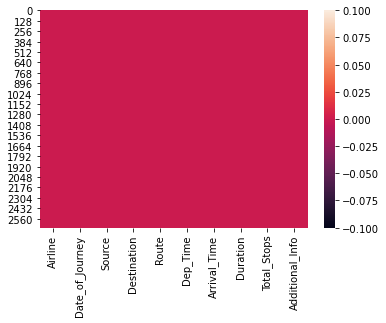

In [194]:
sns.heatmap(df1.isnull())

In [195]:
df1['Journey_date']=df1['Date_of_Journey'].str.split('/').str[0]
df1['Journey_month']=df1['Date_of_Journey'].str.split('/').str[1]
df1.drop(['Date_of_Journey'],axis=1,inplace=True)

In [196]:
df1

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Journey_date,Journey_month
0,Jet Airways,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info,6,06
1,IndiGo,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info,12,05
2,Jet Airways,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included,21,05
3,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info,21,05
4,Air Asia,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info,24,06
5,Jet Airways,Delhi,Cochin,DEL → BOM → COK,18:15,12:35 13 Jun,18h 20m,1 stop,In-flight meal not included,12,06
6,Air India,Banglore,New Delhi,BLR → TRV → DEL,07:30,22:35,15h 5m,1 stop,No info,12,03
7,IndiGo,Kolkata,Banglore,CCU → HYD → BLR,15:15,20:30,5h 15m,1 stop,No info,1,05
8,IndiGo,Kolkata,Banglore,CCU → BLR,10:10,12:55,2h 45m,non-stop,No info,15,03
9,Jet Airways,Kolkata,Banglore,CCU → BOM → BLR,16:30,22:35,6h 5m,1 stop,No info,18,05


In [197]:
df1['Airline'].value_counts()

Jet Airways                          897
IndiGo                               511
Air India                            440
Multiple carriers                    347
SpiceJet                             208
Vistara                              129
Air Asia                              86
GoAir                                 46
Multiple carriers Premium economy      3
Vistara Premium economy                2
Jet Airways Business                   2
Name: Airline, dtype: int64

Text(0, 0.5, 'Count of flights')

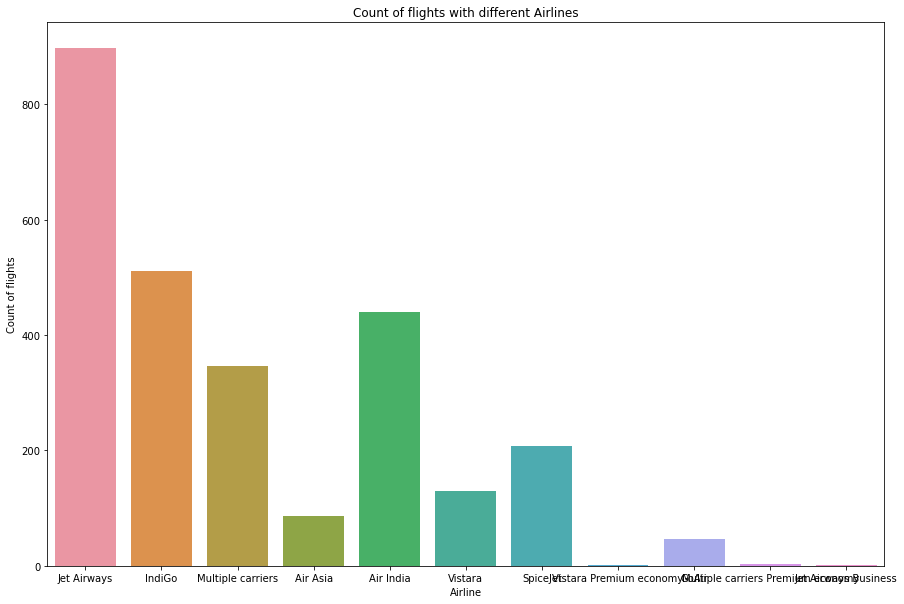

In [200]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights with different Airlines')
ax=sns.countplot(x = 'Airline', data =df1)
plt.xlabel('Airline')
plt.ylabel('Count of flights')

There are more number of flights of Jet Airways.
Jet Airways Business, Vistara Premium economy have actually almost negligible flights.

Text(0, 0.5, 'Count of flights')

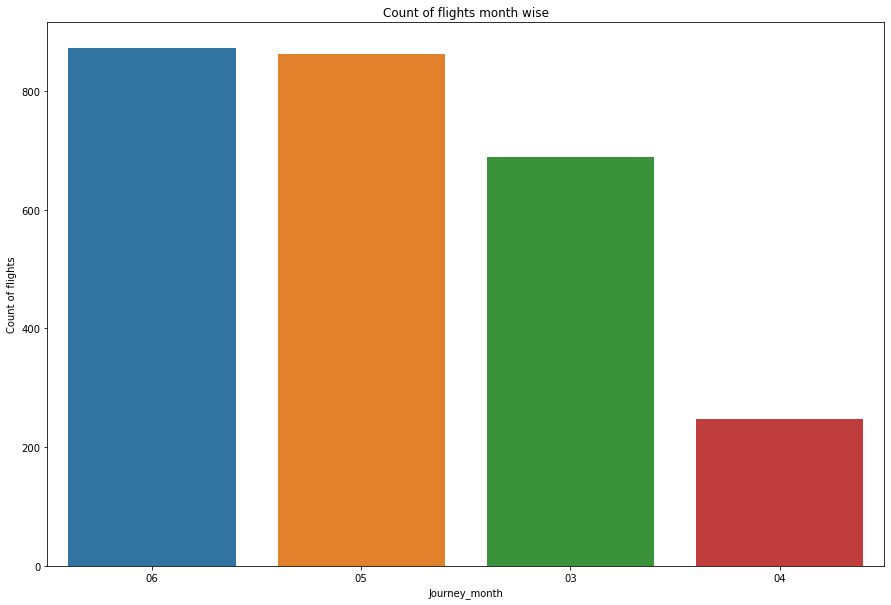

In [202]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights month wise')
ax=sns.countplot(x = 'Journey_month', data=df1)
plt.xlabel('Journey_month')
plt.ylabel('Count of flights')

In [203]:
df1['Journey_month'].value_counts()

06    872
05    863
03    688
04    248
Name: Journey_month, dtype: int64

June is the month where 872 flights i.e highest among all the months are operated which indicates the peak season for travelling.
April is the month where only 248 flights are operated lowest among all the months which indicates slack season for travelling.

In [204]:
df1['Source'].value_counts()

Delhi       1145
Kolkata      710
Banglore     555
Mumbai       186
Chennai       75
Name: Source, dtype: int64

Delhi is the source location from where maximum no of flights are operated.
Chennai is the source location from where minimum no of flights are operated.

Text(0, 0.5, 'Count of flights')

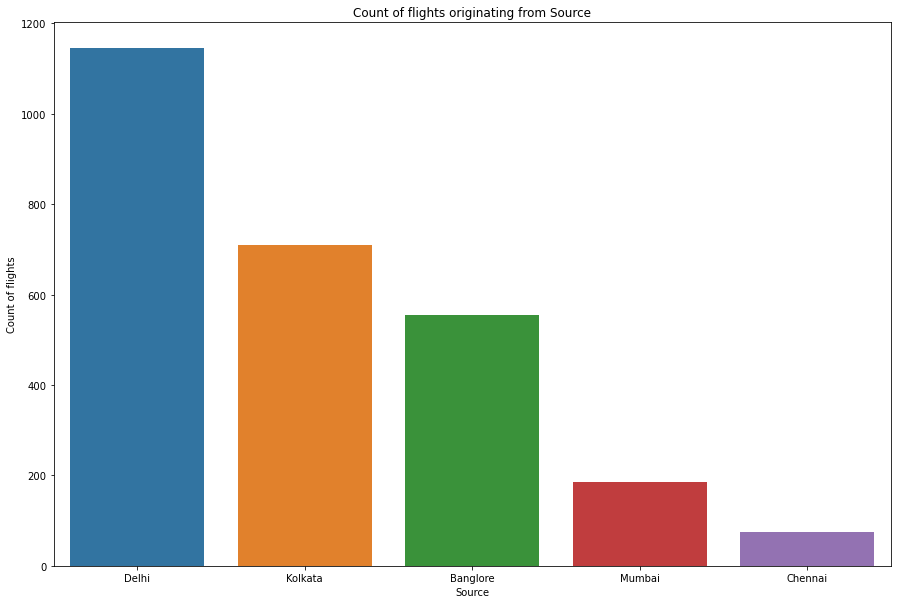

In [206]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights originating from Source')
ax=sns.countplot(x = 'Source', data=df1)
plt.xlabel('Source')
plt.ylabel('Count of flights')

In [207]:
df1['Destination'].value_counts()

Cochin       1145
Banglore      710
Delhi         317
New Delhi     238
Hyderabad     186
Kolkata        75
Name: Destination, dtype: int64

The maximum flights are operated for Cochin as a destination.
The minimum flights are operated for Kolkata as a destination.

Text(0, 0.5, 'Count of flights')

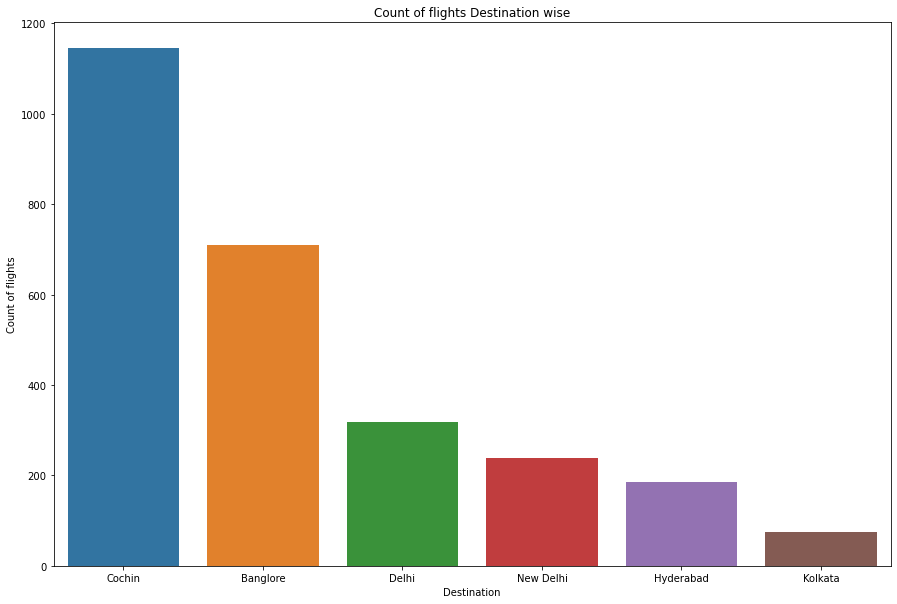

In [209]:
plt.figure(figsize = (15, 10))
plt.title('Count of flights Destination wise')
ax=sns.countplot(x = 'Destination', data=df1)
plt.xlabel('Destination')
plt.ylabel('Count of flights')

In [210]:
df1['Dep_hour']=pd.to_datetime(df1['Dep_Time']).dt.hour
df1['Dep_min']=pd.to_datetime(df1['Dep_Time']).dt.minute
df1.drop(['Dep_Time'],axis=1,inplace=True)

In [211]:
df1['Arrival_hour']=pd.to_datetime(df1['Arrival_Time']).dt.hour
df1['Arrival_min']=pd.to_datetime(df1['Arrival_Time']).dt.minute
df1.drop(['Arrival_Time'],axis=1,inplace=True)

In [212]:
df1['Duration']= df1['Duration'].str.replace("h", '*60').str.replace(' ','+').str.replace('m','*1').apply(eval)

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Journey_date,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min
0,Jet Airways,Delhi,Cochin,DEL → BOM → COK,655,1 stop,No info,6,06,17,30,4,25
1,IndiGo,Kolkata,Banglore,CCU → MAA → BLR,240,1 stop,No info,12,05,6,20,10,20
2,Jet Airways,Delhi,Cochin,DEL → BOM → COK,1425,1 stop,In-flight meal not included,21,05,19,15,19,0
3,Multiple carriers,Delhi,Cochin,DEL → BOM → COK,780,1 stop,No info,21,05,8,0,21,0
4,Air Asia,Banglore,Delhi,BLR → DEL,170,non-stop,No info,24,06,23,55,2,45
5,Jet Airways,Delhi,Cochin,DEL → BOM → COK,1100,1 stop,In-flight meal not included,12,06,18,15,12,35
6,Air India,Banglore,New Delhi,BLR → TRV → DEL,905,1 stop,No info,12,03,7,30,22,35
7,IndiGo,Kolkata,Banglore,CCU → HYD → BLR,315,1 stop,No info,1,05,15,15,20,30
8,IndiGo,Kolkata,Banglore,CCU → BLR,165,non-stop,No info,15,03,10,10,12,55
9,Jet Airways,Kolkata,Banglore,CCU → BOM → BLR,365,1 stop,No info,18,05,16,30,22,35


In [214]:
df1['Total_Stops'].value_counts()

1 stop      1431
non-stop     849
2 stops      379
3 stops       11
4 stops        1
Name: Total_Stops, dtype: int64

<AxesSubplot:xlabel='Total_Stops', ylabel='count'>

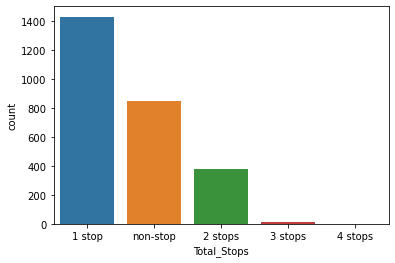

In [215]:
sns.countplot(df1['Total_Stops'])

In [216]:
df1['Total_Stops']=df1['Total_Stops'].replace(['non-stop','2 stops','1 stop','3 stops','4 stops'],[0,2,1,3,4])

In [217]:
df1['Total_Stops'].value_counts()

1    1431
0     849
2     379
3      11
4       1
Name: Total_Stops, dtype: int64

There is only one flight with 4 stops.

In [218]:
df1["Additional_Info"].value_counts()

No info                         2148
In-flight meal not included      444
No check-in baggage included      76
Change airports                    1
Business class                     1
1 Long layover                     1
Name: Additional_Info, dtype: int64

In [219]:
df1['Additional_Info']=df1['Additional_Info'].replace({'Change airports':'Other','Business class':'Other','1 Long layover':'Other'})

In [220]:
df1['Additional_Info'].value_counts()

No info                         2148
In-flight meal not included      444
No check-in baggage included      76
Other                              3
Name: Additional_Info, dtype: int64

In [221]:
le1=LabelEncoder()
df1['Airline']=le1.fit_transform(df1['Airline'])
df1['Source']=le1.fit_transform(df1['Source'])
df1['Destination']=le1.fit_transform(df1['Destination'])
df1['Route']=le1.fit_transform(df1['Route'])
df1['Additional_Info']=le1.fit_transform(df1['Additional_Info'])

In [222]:
df1['Journey_date']=df1['Journey_date'].astype('int')

In [223]:
df1['Journey_month']=df1['Journey_month'].astype('int')

In [225]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2671 entries, 0 to 2670
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Airline          2671 non-null   int32
 1   Source           2671 non-null   int32
 2   Destination      2671 non-null   int32
 3   Route            2671 non-null   int32
 4   Duration         2671 non-null   int64
 5   Total_Stops      2671 non-null   int64
 6   Additional_Info  2671 non-null   int32
 7   Journey_date     2671 non-null   int32
 8   Journey_month    2671 non-null   int32
 9   Dep_hour         2671 non-null   int64
 10  Dep_min          2671 non-null   int64
 11  Arrival_hour     2671 non-null   int64
 12  Arrival_min      2671 non-null   int64
dtypes: int32(7), int64(6)
memory usage: 198.4 KB


In [227]:
X=df1.copy()

In [228]:
X

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Journey_date,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min
0,4,2,1,76,655,1,2,6,6,17,30,4,25
1,3,3,0,65,240,1,2,12,5,6,20,10,20
2,4,2,1,76,1425,1,0,21,5,19,15,19,0
3,6,2,1,76,780,1,2,21,5,8,0,21,0
4,0,0,2,16,170,0,2,24,6,23,55,2,45
5,4,2,1,76,1100,1,0,12,6,18,15,12,35
6,1,0,5,24,905,1,2,12,3,7,30,22,35
7,3,3,0,57,315,1,2,1,5,15,15,20,30
8,3,3,0,43,165,0,2,15,3,10,10,12,55
9,4,3,0,45,365,1,2,18,5,16,30,22,35


In [229]:
se1=StandardScaler()
X=se1.fit_transform(X)

In [231]:
prediction=rfr.predict(X)

In [234]:
df1['Price']=prediction

In [235]:
df1

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Journey_date,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min,Price
0,4,2,1,76,655,1,2,6,6,17,30,4,25,14739.785411
1,3,3,0,65,240,1,2,12,5,6,20,10,20,5222.152384
2,4,2,1,76,1425,1,0,21,5,19,15,19,0,12480.050760
3,6,2,1,76,780,1,2,21,5,8,0,21,0,10935.192082
4,0,0,2,16,170,0,2,24,6,23,55,2,45,4399.768503
5,4,2,1,76,1100,1,0,12,6,18,15,12,35,10645.757282
6,1,0,5,24,905,1,2,12,3,7,30,22,35,9793.164495
7,3,3,0,57,315,1,2,1,5,15,15,20,30,6322.325472
8,3,3,0,43,165,0,2,15,3,10,10,12,55,4877.166252
9,4,3,0,45,365,1,2,18,5,16,30,22,35,14182.197164


# The price has been predicted using test data.